In [1]:
import os
import cv2
import time
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader
from utils_gen_NN import gen_paths_img_dm_complete, generate_density_maps_from_annotations, create_data_loader
from utils_imgproc_NN import norm_by_imagenet
from utils_gen_NN import gen_paths_img_dm_complete, create_data_loader
plt.ioff()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

net = 'CSRNet'
dataset = "A"
print("Checking and generating density maps from annotations if needed...")
try:
    generate_density_maps_from_annotations(
        data_root='/Users/soumyadip_iitk/Desktop/Dense Crowd Model/Sanghai_Data',
        dataset=dataset
    )
    print("Density map generation completed!")
except Exception as e:
    print(f"Note: Density map generation encountered: {e}")
    print("Continuing with existing density maps...")

paths = gen_paths_img_dm_complete(
    data_root='/Users/soumyadip_iitk/Desktop/Dense Crowd Model/Sanghai_Data',
    dataset=dataset
)

train_img_paths = paths['train']['images']
train_dm_paths = paths['train']['density_maps']
test_img_paths = paths['test']['images']
test_dm_paths = paths['test']['density_maps']

print('Test data size:', len(test_img_paths))
print('Train data size:', len(train_img_paths))
target_size=(768, 1024)
# Create PyTorch DataLoaders with target_size
test_dataloader = create_data_loader(
    test_img_paths, test_dm_paths, 
    batch_size=1, shuffle=False, stride=8, unit_len=16, target_size=(768, 1024)
)

train_dataloader = create_data_loader(
    train_img_paths, train_dm_paths, 
    batch_size=4, shuffle=True, stride=8, unit_len=16, target_size=(768, 1024)
)

# Delete the directory for saving weights during last training
weights_dir = 'weights_' + dataset
if os.path.exists(weights_dir):
    shutil.rmtree(weights_dir)

# Create new weights directory
os.makedirs(weights_dir, exist_ok=True)

# Optional: If you still need the data as tensors for compatibility (not recommended for large datasets)
def load_data_as_tensors_if_needed():
    """Load data as tensors only if needed for backward compatibility"""
    from utils_gen_NN import gen_var_from_paths_torch
    
    print("Loading test data as tensors...")
    test_x = gen_var_from_paths_torch(test_img_paths, stride=1, unit_len=16, device='cpu')
    test_y = gen_var_from_paths_torch(test_dm_paths, stride=8, unit_len=16, device='cpu')
    
    # Apply ImageNet normalization to test images
    mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1)
    test_x = (test_x / 255.0 - mean) / std
    
    print("Loading train data as tensors...")
    train_x = gen_var_from_paths_torch(train_img_paths, stride=1, unit_len=16, device='cpu')
    train_y = gen_var_from_paths_torch(train_dm_paths, stride=8, unit_len=16, device='cpu')
    
    print('Test data tensor shapes:', test_x.shape, test_y.shape)
    print('Train data tensor shapes:', train_x.shape, train_y.shape)
    
    return test_x, test_y, train_x, train_y

# Example of how to use the DataLoaders (recommended approach)
print("\nExample batch from train dataloader:")
try:
    for batch_idx, (images, density_maps) in enumerate(train_dataloader):
        images = images.to(device)
        density_maps = density_maps.to(device)
        
        print(f"Batch {batch_idx}: Images shape: {images.shape}, Density maps shape: {density_maps.shape}")
        print(f"Images dtype: {images.dtype}, Density maps dtype: {density_maps.dtype}")
        print(f"Images range: [{images.min():.3f}, {images.max():.3f}]")
        print(f"Density maps sum: {density_maps.sum().item():.2f}")
        
        if batch_idx == 0:  # Just show first batch
            break
except Exception as e:
    print(f"Error in train dataloader: {e}")

print("\nExample batch from test dataloader:")
try:
    for batch_idx, (images, density_maps) in enumerate(test_dataloader):
        images = images.to(device)
        density_maps = density_maps.to(device)
        
        print(f"Batch {batch_idx}: Images shape: {images.shape}, Density maps shape: {density_maps.shape}")
        print(f"Images dtype: {images.dtype}, Density maps dtype: {density_maps.dtype}")
        print(f"Images range: [{images.min():.3f}, {images.max():.3f}]")
        print(f"Density maps sum: {density_maps.sum().item():.2f}")
        
        if batch_idx == 0:  # Just show first batch
            break
except Exception as e:
    print(f"Error in test dataloader: {e}")

# Uncomment the line below if you need tensor data for backward compatibility
# test_x, test_y, train_x, train_y = load_data_as_tensors_if_needed()

print(f"\nDataLoaders created successfully!")
print(f"Train batches: {len(train_dataloader)}")
print(f"Test batches: {len(test_dataloader)}")


Using device: cpu
Checking and generating density maps from annotations if needed...
Generating density maps for train set...
Completed train set density map generation
Generating density maps for test set...
Completed test set density map generation
Density map generation completed!
Test data size: 182
Train data size: 300

Example batch from train dataloader:


/Users/soumyadip_iitk/Desktop/Dense Crowd Model/.venv/lib/python3.12/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Batch 0: Images shape: torch.Size([4, 3, 1024, 768]), Density maps shape: torch.Size([4, 1, 128, 96])
Images dtype: torch.float32, Density maps dtype: torch.float32
Images range: [-2.118, 2.640]
Density maps sum: 67.55

Example batch from test dataloader:
Batch 0: Images shape: torch.Size([1, 3, 1024, 768]), Density maps shape: torch.Size([1, 1, 128, 96])
Images dtype: torch.float32, Density maps dtype: torch.float32
Images range: [-2.114, 2.640]
Density maps sum: 3.00

DataLoaders created successfully!
Train batches: 75
Test batches: 182


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
import os
from CSRNet_NN import CSRNet
model_dir = 'models'
os.makedirs(model_dir, exist_ok=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

model = CSRNet().to(device)

print("Model architecture:")
print(model)
print(f"Total parameters: {sum(p.numel() for p in model.parameters()):,}")

# Setup optimizer and loss
optimizer = optim.Adam(model.parameters(), lr=1e-5)
criterion = nn.MSELoss()  # Mean Squared Error loss

# Save model architecture diagram
try:
    writer = SummaryWriter(log_dir='runs/CSRNet')
    dummy_input = torch.randn(1, 3, 256, 256).to(device)
    writer.add_graph(model, dummy_input)
    writer.close()
    print("Model graph saved to TensorBoard")
except Exception as e:
    print(f"Couldn't save model graph: {e}")

# Save initial model weights
torch.save(model.state_dict(), os.path.join(model_dir, f'{net}.pth'))
print(f"Initial model weights saved to {model_dir}/{net}.pth")

CSRNet(
  (frontend): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilatio

In [ ]:
import os
import sys
import time
import numpy as np
import torch
import pandas as pd
import matplotlib.pyplot as plt
from utilis_callback_NN import eval_loss
from utils_imgproc_NN import image_preprocessing
from utils_loss_NN import MSE_BCE_Loss  # If you want to use your custom loss

# Settings
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
num_epochs = 1
val_rate = 0.5
val_rate_dec = {'A': [80, 70], 'B': [9, 8.5]}
best_values = {'mae': 1e5, 'rmse': 1e5, 'sfn': 1e5, 'mape': 1e5}
losses = [[1e5, 1e5, 1e5, 1e5]]
LOSS = 'MSE'  # or 'MSE_BCE' if using custom loss

# Display settings
dis_idx = 16 if dataset == 'B' else 0
dis_lim = (5, 35) if dataset == 'B' else (40, 150)
time_st = time.time()

# Choose loss function
if LOSS == 'MSE':
    criterion = torch.nn.MSELoss()
elif LOSS == 'MSE_BCE':
    criterion = MSE_BCE_Loss()
else:
    raise ValueError("Unknown loss type")

optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

# Pre-load all test data as numpy arrays for eval_loss compatibility
test_images_np = []
test_density_np = []
for images, density_maps in test_dataloader:
    test_images_np.append(images.cpu().numpy())
    density_maps = density_maps.cpu().numpy()
    test_density_np.append(density_maps)
test_images_np = np.concatenate(test_images_np, axis=0)
test_density_np = np.concatenate(test_density_np, axis=0)

# Training loop
for epoch in range(num_epochs):
    model.train()
    for batch_idx, (images, density_maps) in enumerate(train_dataloader):
        images = images.to(device)
        density_maps = density_maps.to(device)

        # PyTorch-based horizontal flip augmentation (50% chance)
        if torch.rand(1).item() > 0.5:
            images = torch.flip(images, dims=[3])
            density_maps = torch.flip(density_maps, dims=[3])

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, density_maps)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Validation and checkpointing
        current_iter = batch_idx + 1
        total_iters = len(train_dataloader)
        if current_iter % int(total_iters * val_rate) == 0:
            model.eval()
            with torch.no_grad():
                mae, rmse, sfn, mape = eval_loss(
                    model, test_images_np, test_density_np, device=device, quality=False
                )
            model.train()

            loss_vals = [mae, rmse, sfn, mape]
            losses.append(loss_vals)

            # Adjust validation rate
            if mae < val_rate_dec[dataset][0]:
                val_rate = min(val_rate, 0.25)
            if mae < val_rate_dec[dataset][1]:
                val_rate = min(val_rate, 0.1)

            # Check for best values
            to_save = False
            if (mae < best_values['mae']) or (mae == best_values['mae'] and rmse < best_values['rmse']):
                torch.save(model.state_dict(), os.path.join(weights_dir, f'{net}_best.pth'))
                to_save = True

            # Update best values
            metrics = ['mae', 'rmse', 'sfn', 'mape']
            for i, metric in enumerate(metrics):
                if loss_vals[i] < best_values[metric]:
                    best_values[metric] = loss_vals[i]
                    to_save = True

            # Save checkpoint if improved
            if to_save:
                filename = f"{net}_MAE{mae:.3f}_RMSE{rmse:.3f}_SFN{sfn:.3f}_MAPE{mape:.3f}_epoch{epoch+1}-{current_iter}.pth"
                torch.save(model.state_dict(), os.path.join(weights_dir, filename))

        # Progress panel
        time_consuming = time.time() - time_st
        last_loss = np.round(np.array(losses)[-1], 2)
        sys.stdout.write(
            f'Epoch {epoch+1}-{current_iter}/{total_iters}, '
            f'MAE-RMSE-SFN-MAPE={last_loss}, '
            f'Time={int(time_consuming//60)}m{int(time_consuming%60)}s\r'
        )
        sys.stdout.flush()

# Save losses
losses_np = np.array(losses[1:])
pd.DataFrame(losses_np, columns=['MAE', 'RMSE', 'SFN', 'MAPE']).to_csv(
    os.path.join(weights_dir, 'loss.csv'), index=False
)

# Plot results
plt.figure(figsize=(12, 6))
losses_MAE = losses_np[:, 0]
losses_RMSE = losses_np[:, 1]
losses_SFN = losses_np[:, 2]
losses_MAPE = losses_np[:, 3]

plt.subplot(1, 2, 1)
plt.plot(losses_MAE, 'r', label='MAE')
plt.plot(losses_RMSE, 'b', label='RMSE')
plt.plot(losses_MAPE, 'g', label='MAPE')
plt.legend()
plt.title('Validation Metrics')
plt.ylabel('Value')
plt.xlabel('Validation Step')

plt.subplot(1, 2, 2)
multiplier = int(round(dis_lim[0] / (np.min(losses_SFN) + 0.1)))
plt.plot(losses_SFN * multiplier, 'm', label=f'SFN x {multiplier}')
plt.ylim(dis_lim)
plt.legend()
plt.title('SFN (Scaled)')
plt.xlabel('Validation Step')

plt.tight_layout()
plt.savefig(os.path.join(weights_dir, f'{net}_val_loss.png'))
plt.show()

# Rename weights directory
end_time = time.strftime("%Y%m%d-%H%M%S")
suffix = f"{dataset}_{LOSS}_bestMAE{best_values['mae']:.3f}_{end_time}"
weights_dir_new = f'weights_{suffix}'
os.rename(weights_dir, weights_dir_new)
print(f"\nTraining complete! Model weights saved to: {weights_dir_new}")


/Users/soumyadip_iitk/Desktop/Dense Crowd Model/.venv/lib/python3.12/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


In [2]:
import torch
from CSRNet_NN import CSRNet
from utils_gen_NN import gen_paths_img_dm_complete, create_data_loader
from utilis_callback_NN import eval_loss
import numpy as np

# Load model and checkpoint
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CSRNet().to(device)

# Fix: Add weights_only=False
checkpoint = torch.load(
    '/Users/soumyadip_iitk/Desktop/Dense Crowd Model/PartAmodel_best.pth (1).tar', 
    map_location=device, 
    weights_only=False  # This fixes the UnpicklingError
)

# Load the state dict
if 'state_dict' in checkpoint:
    model.load_state_dict(checkpoint['state_dict'])
    print("Loaded from checkpoint['state_dict']")
else:
    model.load_state_dict(checkpoint)
    print("Loaded directly from checkpoint")

model.eval()
print("Model loaded successfully!")


CSRNet(
  (frontend): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilatio

In [ ]:
import torch
from CSRNet_NN import CSRNet
from utils_gen_NN import gen_paths_img_dm_complete, create_data_loader
from utilis_callback_NN import eval_loss, callbacks_during_train
import numpy as np

# Settings
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
data_root = '/Users/soumyadip_iitk/Desktop/Dense Crowd Model/Sanghai_Data'
dataset = 'A'

# Load model and weights
model = CSRNet().to(device)
checkpoint = torch.load(
    '/Users/soumyadip_iitk/Desktop/Dense Crowd Model/PartAmodel_best.pth (1).tar', 
    map_location=device, 
    weights_only=False
)

# Load state dict
if 'state_dict' in checkpoint:
    model.load_state_dict(checkpoint['state_dict'])
else:
    model.load_state_dict(checkpoint)

model.eval()
print("Model loaded successfully!")

# Prepare test data
paths = gen_paths_img_dm_complete(data_root, dataset)
test_img_paths = paths['test']['images']
test_dm_paths = paths['test']['density_maps']

test_dataloader = create_data_loader(
    test_img_paths, test_dm_paths,
    batch_size=1, shuffle=False, stride=8, unit_len=16
)

# Convert test data to numpy for eval_loss
test_images_np = []
test_density_np = []
for images, density_maps in test_dataloader:
    test_images_np.append(images.cpu().numpy())
    test_density_np.append(density_maps.cpu().numpy())
test_images_np = np.concatenate(test_images_np, axis=0)
test_density_np = np.concatenate(test_density_np, axis=0)

# Evaluate model
print("Evaluating model...")
mae, rmse, sfn, mape = eval_loss(model, test_images_np, test_density_np, device=device)
print(f"Evaluation Results:")
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"SFN: {sfn:.2f}")
print(f"MAPE: {mape:.2f}")

# Optional: Visualize some predictions
print("Generating sample predictions...")
for i in range(min(3, len(test_images_np))):
    callbacks_during_train(
        model, 
        test_images_np[i], 
        test_density_np[i], 
        test_img_paths[i], 
        net='CSRNet', 
        epoch=f'test_{i}', 
        device=device
    )
print("Sample predictions saved in 'tmp/' directory")


Model loaded successfully!


/Users/soumyadip_iitk/Desktop/Dense Crowd Model/.venv/lib/python3.12/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Evaluating model...
Evaluation Results:
MAE: 300.40
RMSE: 400.82
SFN: 1.11
MAPE: 32.12
Generating sample predictions...
Sample predictions saved in 'tmp/' directory


: 

0/182
100/182


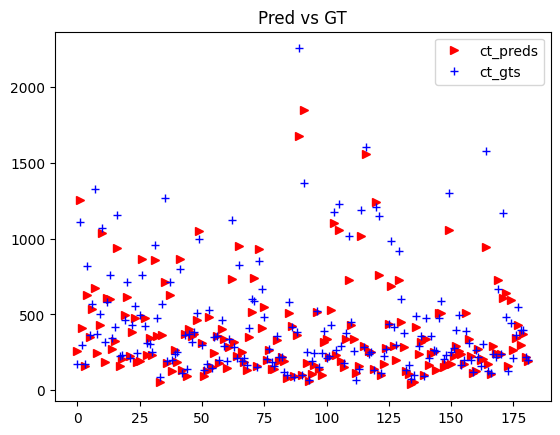

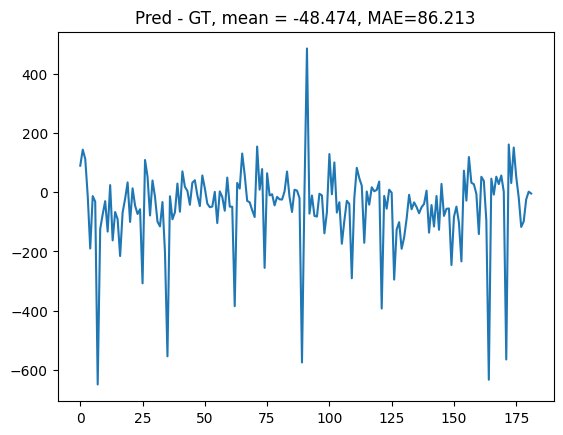

In [12]:
import h5py
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

model.eval()
ct_preds = []
ct_gts = []

for i in range(len(test_img_paths)):
    if i % 100 == 0:
        print(f'{i}/{len(test_img_paths)}')
    
    # Load and preprocess image as before
    img_path = test_img_paths[i]
    dm_path = test_dm_paths[i]  # This is the .h5 file path
    
    # Load ground truth density map from .h5
    with h5py.File(dm_path, 'r') as f:
        gt_density = f['density'][()]
    
    # Prepare input for model (depends on your preprocessing)
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB).astype(np.float32)
    img = cv2.resize(img, (1024, 768), interpolation=cv2.INTER_LINEAR)  # Use your target size
    img = img / 255.0
    img = (img - np.array([0.485, 0.456, 0.406])) / np.array([0.229, 0.224, 0.225])
    img = np.transpose(img, (2, 0, 1))  # CHW
    input_tensor = torch.tensor(img, dtype=torch.float32).unsqueeze(0).to(device)
    
    # Model prediction
    with torch.no_grad():
        pred = model(input_tensor).squeeze().cpu().numpy()
    
    ct_pred = np.sum(pred)
    ct_gt = np.sum(gt_density)
    ct_preds.append(ct_pred)
    ct_gts.append(ct_gt)

# Plotting and further analysis as before...
plt.plot(ct_preds, 'r>')
plt.plot(ct_gts, 'b+')
plt.legend(['ct_preds', 'ct_gts'])
plt.title('Pred vs GT')
plt.show()

error = np.array(ct_preds) - np.array(ct_gts)
plt.plot(error)
plt.title('Pred - GT, mean = {}, MAE={}'.format(
    str(round(np.mean(error), 3)),
    str(round(np.mean(np.abs(error)), 3))
))
plt.show()

Running predictions on all test samples...
Processing 0/182
Processing 50/182
Processing 100/182
Processing 150/182

=== 10 Worst Prediction Cases ===
Overall MAE: 86.21
Overall RMSE: 143.10

Worst Case #1: Index 7
Ground Truth: 1326, Prediction: 676.8, Error: -649.2


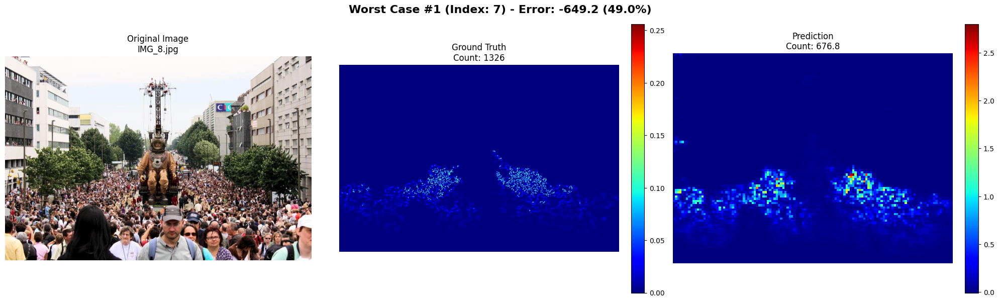


Worst Case #2: Index 164
Ground Truth: 1581, Prediction: 947.8, Error: -633.2


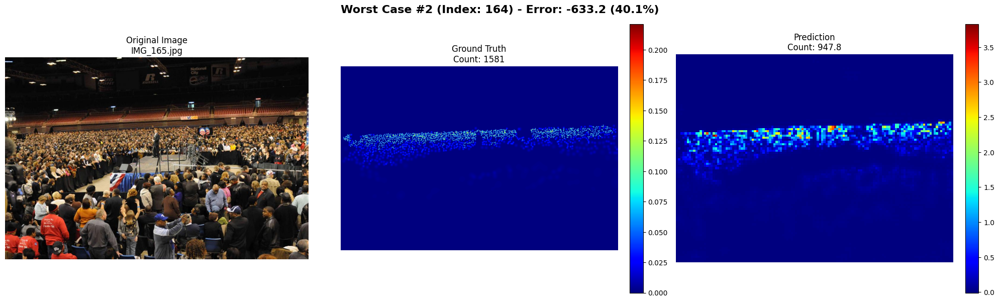


Worst Case #3: Index 89
Ground Truth: 2256, Prediction: 1681.3, Error: -574.7


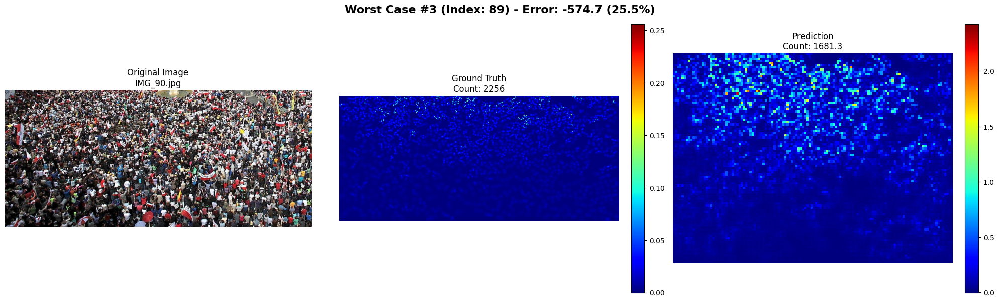


Worst Case #4: Index 171
Ground Truth: 1171, Prediction: 606.2, Error: -564.8


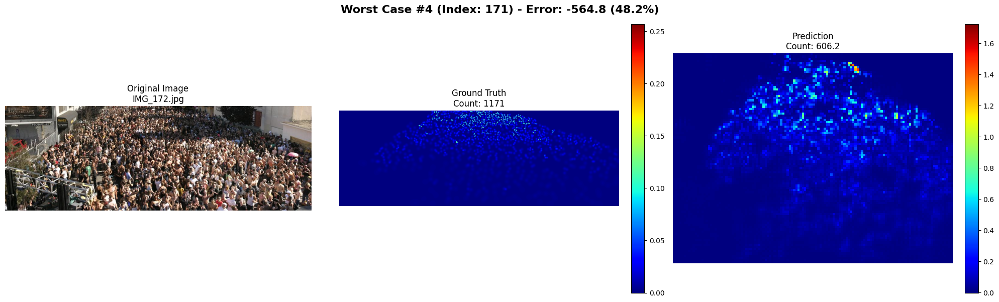


Worst Case #5: Index 35
Ground Truth: 1266, Prediction: 711.8, Error: -554.2


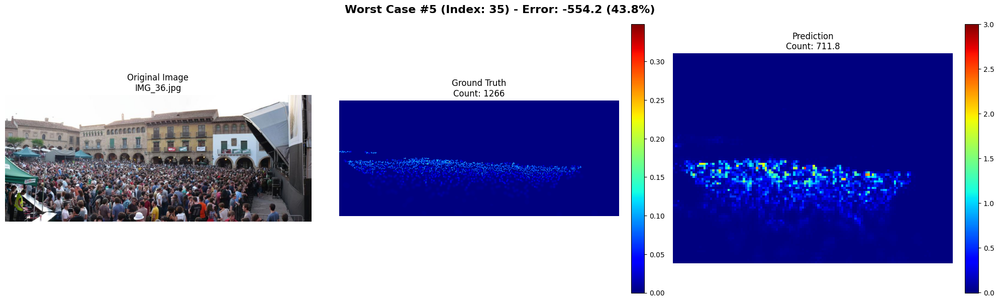


Worst Case #6: Index 91
Ground Truth: 1366, Prediction: 1850.8, Error: 484.8


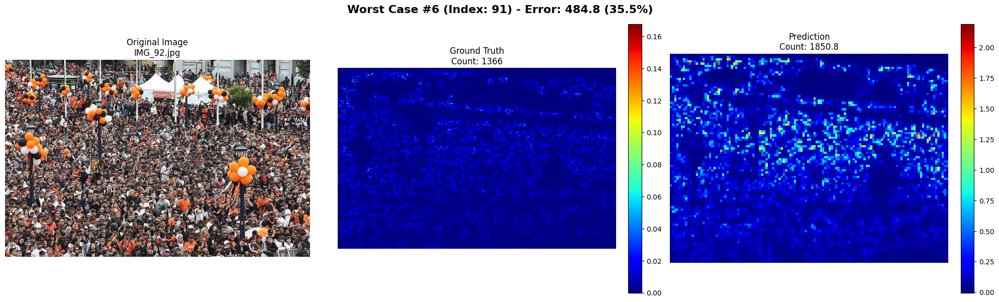


Worst Case #7: Index 121
Ground Truth: 1153, Prediction: 760.2, Error: -392.8


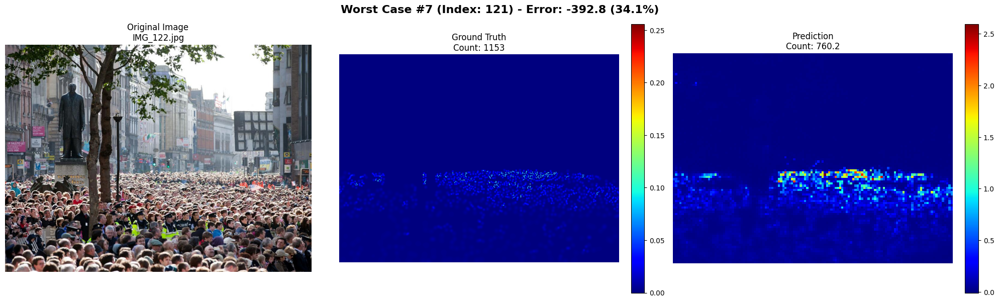


Worst Case #8: Index 62
Ground Truth: 1121, Prediction: 736.0, Error: -385.0


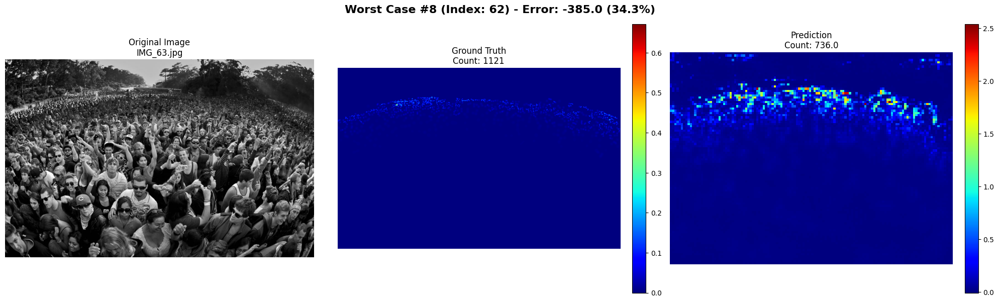


Worst Case #9: Index 25
Ground Truth: 497, Prediction: 189.2, Error: -307.8


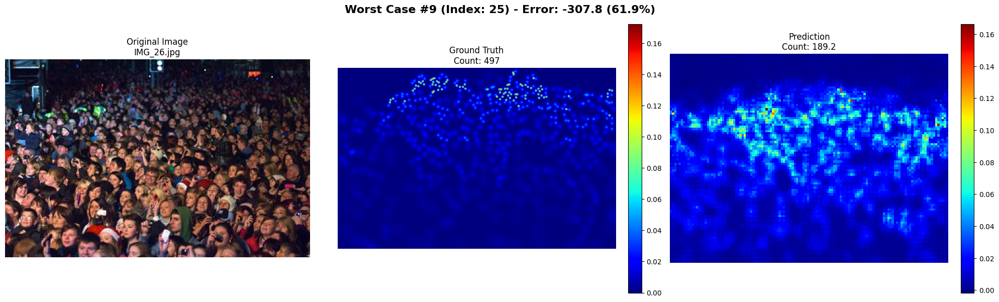


Worst Case #10: Index 126
Ground Truth: 986, Prediction: 690.8, Error: -295.2


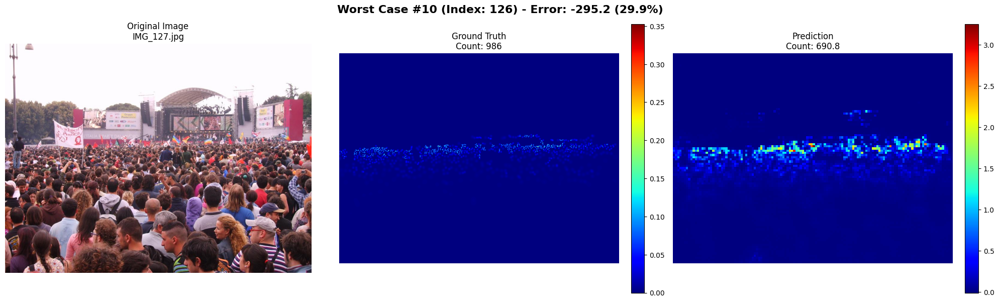


=== Summary of 10 Worst Cases ===
Average error in worst cases: -387.21
Average absolute error in worst cases: 484.17
Average ground truth count in worst cases: 1272.30
Average predicted count in worst cases: 885.09


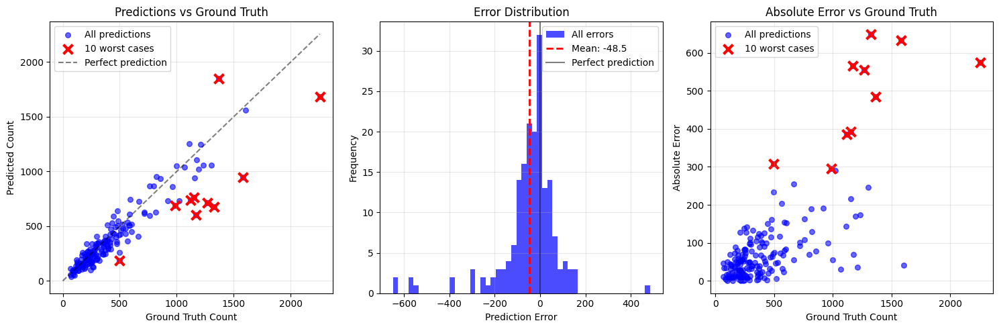


Detailed analysis saved to 'worst_10_cases_analysis.csv'

Generating additional visualizations using utility function...


RuntimeError: Given groups=1, weight of size [64, 3, 3, 3], expected input[1, 1, 96, 128] to have 3 channels, but got 1 channels instead

In [5]:
import os
import cv2
import h5py
import numpy as np
import torch
import matplotlib.pyplot as plt
from utilis_callback_NN import eval_loss, callbacks_during_train

# Ensure model is in evaluation mode
model.eval()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print("Running predictions on all test samples...")
ct_preds = []
ct_gts = []
predictions = []
ground_truths = []

# Run predictions on all test samples
with torch.no_grad():
    for i in range(len(test_img_paths)):
        if i % 50 == 0:
            print(f'Processing {i}/{len(test_img_paths)}')
        
        # Load image
        img_path = test_img_paths[i]
        dm_path = test_dm_paths[i]
        
        # Load ground truth density map from .h5 file
        with h5py.File(dm_path, 'r') as f:
            gt_density = f['density'][()]
        
        # Prepare image for model input
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB).astype(np.float32)
        img = cv2.resize(img, (1024, 768), interpolation=cv2.INTER_LINEAR)  # Use your target size
        img = img / 255.0
        
        # Apply ImageNet normalization
        img[..., 0] = (img[..., 0] - 0.485) / 0.229
        img[..., 1] = (img[..., 1] - 0.456) / 0.224
        img[..., 2] = (img[..., 2] - 0.406) / 0.225
        
        # Convert to tensor (CHW format)
        img_tensor = torch.tensor(np.transpose(img, (2, 0, 1)), dtype=torch.float32).unsqueeze(0).to(device)
        
        # Get prediction
        pred_tensor = model(img_tensor)
        pred = pred_tensor.squeeze().cpu().numpy()
        
        # Calculate counts
        ct_pred = np.sum(pred)
        ct_gt = np.sum(gt_density)
        
        ct_preds.append(ct_pred)
        ct_gts.append(ct_gt)
        predictions.append(pred)
        ground_truths.append(gt_density)

# Calculate errors and find worst cases
ct_preds = np.array(ct_preds)
ct_gts = np.array(ct_gts)
errors = ct_preds - ct_gts
absolute_errors = np.abs(errors)

# Find indices of 10 worst predictions
worst_indices = np.argsort(absolute_errors)[::-1][:10]

print(f"\n=== 10 Worst Prediction Cases ===")
print(f"Overall MAE: {np.mean(absolute_errors):.2f}")
print(f"Overall RMSE: {np.sqrt(np.mean(errors**2)):.2f}")

# Visualize the 10 worst cases
for rank, idx in enumerate(worst_indices):
    print(f"\nWorst Case #{rank+1}: Index {idx}")
    print(f"Ground Truth: {ct_gts[idx]:.0f}, Prediction: {ct_preds[idx]:.1f}, Error: {errors[idx]:.1f}")
    
    # Load original image
    img_path = test_img_paths[idx]
    original_img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    
    # Get prediction and ground truth
    pred = predictions[idx]
    gt_density = ground_truths[idx]
    
    # Create visualization
    fig, (ax_orig, ax_gt, ax_pred) = plt.subplots(1, 3, figsize=(20, 6))
    
    # Original image
    ax_orig.imshow(original_img)
    ax_orig.set_title(f'Original Image\n{os.path.basename(img_path)}', fontsize=12)
    ax_orig.axis('off')
    
    # Ground truth density map
    im_gt = ax_gt.imshow(gt_density, cmap='jet')
    ax_gt.set_title(f'Ground Truth\nCount: {ct_gts[idx]:.0f}', fontsize=12)
    ax_gt.axis('off')
    plt.colorbar(im_gt, ax=ax_gt, fraction=0.046, pad=0.04)
    
    # Prediction density map
    im_pred = ax_pred.imshow(pred, cmap='jet')
    ax_pred.set_title(f'Prediction\nCount: {ct_preds[idx]:.1f}', fontsize=12)
    ax_pred.axis('off')
    plt.colorbar(im_pred, ax=ax_pred, fraction=0.046, pad=0.04)
    
    # Add overall title with error information
    error_val = errors[idx]
    error_percent = (abs(error_val) / ct_gts[idx]) * 100 if ct_gts[idx] > 0 else 0
    fig.suptitle(f'Worst Case #{rank+1} (Index: {idx}) - Error: {error_val:.1f} ({error_percent:.1f}%)', 
                 fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    plt.show()

# Summary statistics for worst cases
worst_errors = errors[worst_indices]
worst_gt = ct_gts[worst_indices]
worst_pred = ct_preds[worst_indices]

print(f"\n=== Summary of 10 Worst Cases ===")
print(f"Average error in worst cases: {np.mean(worst_errors):.2f}")
print(f"Average absolute error in worst cases: {np.mean(np.abs(worst_errors)):.2f}")
print(f"Average ground truth count in worst cases: {np.mean(worst_gt):.2f}")
print(f"Average predicted count in worst cases: {np.mean(worst_pred):.2f}")

# Create summary plot comparing all predictions vs ground truth with worst cases highlighted
plt.figure(figsize=(15, 5))

# Plot 1: Predictions vs Ground Truth
plt.subplot(1, 3, 1)
plt.scatter(ct_gts, ct_preds, alpha=0.6, s=30, c='blue', label='All predictions')
plt.scatter(ct_gts[worst_indices], ct_preds[worst_indices], 
           c='red', s=100, marker='x', linewidth=3, label='10 worst cases')
plt.plot([0, max(ct_gts)], [0, max(ct_gts)], 'k--', alpha=0.5, label='Perfect prediction')
plt.xlabel('Ground Truth Count')
plt.ylabel('Predicted Count')
plt.title('Predictions vs Ground Truth')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 2: Error distribution
plt.subplot(1, 3, 2)
plt.hist(errors, bins=50, alpha=0.7, color='blue', label='All errors')
plt.axvline(np.mean(errors), color='red', linestyle='--', linewidth=2, label=f'Mean: {np.mean(errors):.1f}')
plt.axvline(0, color='black', linestyle='-', alpha=0.5, label='Perfect prediction')
plt.xlabel('Prediction Error')
plt.ylabel('Frequency')
plt.title('Error Distribution')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 3: Absolute error vs ground truth
plt.subplot(1, 3, 3)
plt.scatter(ct_gts, absolute_errors, alpha=0.6, s=30, c='blue', label='All predictions')
plt.scatter(ct_gts[worst_indices], absolute_errors[worst_indices], 
           c='red', s=100, marker='x', linewidth=3, label='10 worst cases')
plt.xlabel('Ground Truth Count')
plt.ylabel('Absolute Error')
plt.title('Absolute Error vs Ground Truth')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Save detailed results
import pandas as pd
worst_cases_df = pd.DataFrame({
    'rank': range(1, 11),
    'image_index': worst_indices,
    'image_path': [test_img_paths[i] for i in worst_indices],
    'ground_truth': ct_gts[worst_indices],
    'prediction': ct_preds[worst_indices],
    'error': errors[worst_indices],
    'absolute_error': absolute_errors[worst_indices],
    'error_percentage': [abs(errors[i])/ct_gts[i]*100 if ct_gts[i] > 0 else 0 for i in worst_indices]
})

worst_cases_df.to_csv('worst_10_cases_analysis.csv', index=False)
print(f"\nDetailed analysis saved to 'worst_10_cases_analysis.csv'")
# Just first 3 for utility function
# Optional: Use your utility function for additional visualizations
print("\nGenerating additional visualizations using utility function...")
for rank, idx in enumerate(worst_indices[:3]):  
    callbacks_during_train(
        model, 
        predictions[idx],       # predicted density map
        ground_truths[idx],     # ground truth density map
        test_img_paths[idx], 
        net='CSRNet', 
        epoch=f'worst_{rank+1}', 
        device=device
    )



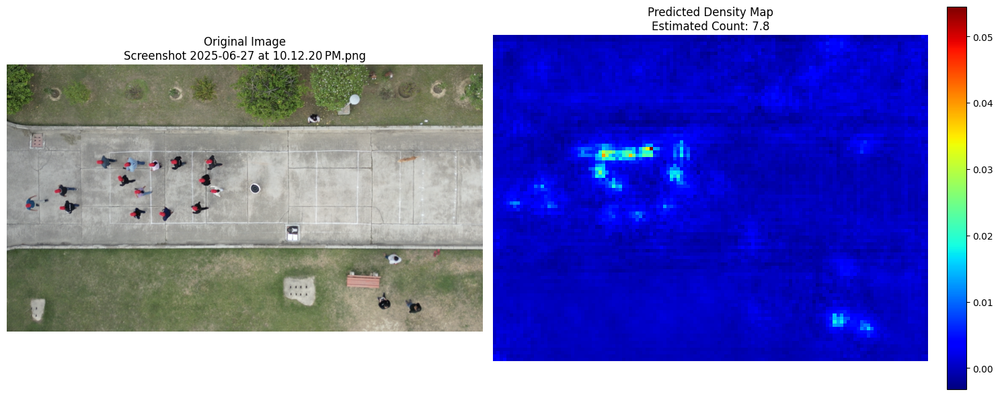

Predicted Head Count: 7.8


In [3]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from CSRNet_NN import CSRNet

def predict_and_visualize(image_path, model_weights_path, device='cpu'):
    """
    Predict head count from an image and visualize the original image with predicted density map
    
    Args:
        image_path: Path to input image
        model_weights_path: Path to trained CSRNet weights
        device: 'cuda' or 'cpu'
    """
    # Load model
    model = CSRNet().to(device)
    checkpoint = torch.load(model_weights_path, map_location=device, weights_only=False)
    
    if 'state_dict' in checkpoint:
        model.load_state_dict(checkpoint['state_dict'])
    else:
        model.load_state_dict(checkpoint)
    
    # Preprocess image
    def preprocess_image(img_path, target_size=(1024, 768)):
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB).astype(np.float32)
        original_img = img.copy()
        img = cv2.resize(img, target_size, interpolation=cv2.INTER_LINEAR)
        img = img / 255.0
        img[..., 0] = (img[..., 0] - 0.485) / 0.229
        img[..., 1] = (img[..., 1] - 0.456) / 0.224
        img[..., 2] = (img[..., 2] - 0.406) / 0.225
        img_tensor = torch.tensor(np.transpose(img, (2, 0, 1)), dtype=torch.float32).unsqueeze(0)
        return img_tensor, original_img
    
    # Get prediction
    with torch.no_grad():
        img_tensor, original_img = preprocess_image(image_path)
        img_tensor = img_tensor.to(device)
        density_map = model(img_tensor).squeeze().cpu().numpy()
    
    # Calculate count
    count = np.sum(density_map)
    
    # Create visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Original image
    ax1.imshow(original_img.astype(np.uint8))
    ax1.set_title(f'Original Image\n{os.path.basename(image_path)}')
    ax1.axis('off')
    
    # Density map
    im = ax2.imshow(density_map, cmap='jet')
    ax2.set_title(f'Predicted Density Map\nEstimated Count: {count:.1f}')
    ax2.axis('off')
    plt.colorbar(im, ax=ax2, fraction=0.046, pad=0.04)
    
    plt.tight_layout()
    plt.show()
    
    print(f"Predicted Head Count: {count:.1f}")
    return count, density_map

# Example usage
if __name__ == "__main__":
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    image_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/Screenshot 2025-06-27 at 10.12.20 PM.png"
    model_weights_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/PartAmodel_best.pth (1).tar"
    count, density_map = predict_and_visualize(image_path, model_weights_path, device)


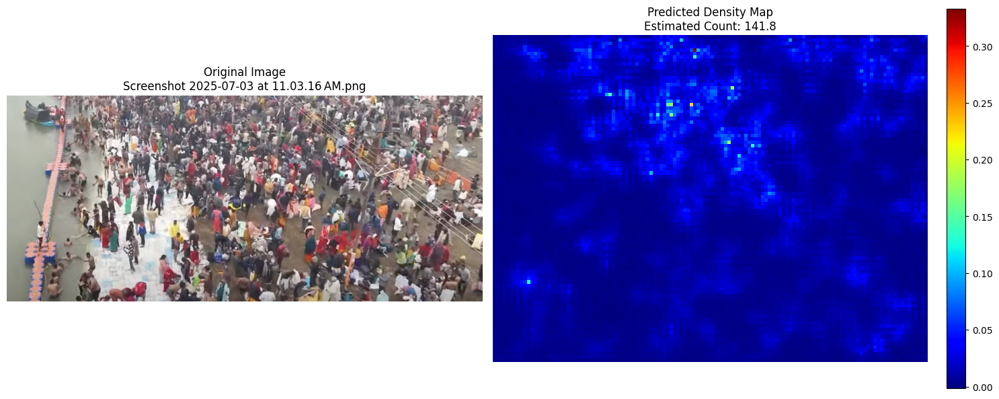

Predicted Head Count: 141.8


In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
image_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/Screenshot 2025-07-03 at 11.03.16 AM.png"
model_weights_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/PartAmodel_best.pth (1).tar"
count, density_map = predict_and_visualize(image_path, model_weights_path, device)

In [ ]:
import torch
from RealESRGAN.rrdbnet_arch import RRDBNet

weights_path = '/Users/soumyadip_iitk/Desktop/Dense Crowd Model/My_Model_CSRNet/RealESRGAN_x4plus.pth'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Create model
model = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=23, num_grow_ch=32, scale=4)

# Load weights correctly
loadnet = torch.load(weights_path, map_location=device)
if 'params_ema' in loadnet:
    keyname = 'params_ema'
elif 'params' in loadnet:
    keyname = 'params'
else:
    keyname = None

if keyname is not None:
    model.load_state_dict(loadnet[keyname], strict=True)
else:
    model.load_state_dict(loadnet, strict=True)

model.eval()
model = model.to(device)


/Users/soumyadip_iitk/Desktop/Dense Crowd Model/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/soumyadip_iitk/Desktop/Dense Crowd Model/.venv/lib/python3.12/site-packages/RealESRGAN/model.py:59: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @torch.cuda.amp.autocast()
/Users/soumyadip_iitk/Desktop/Dense Crowd Model/.venv/lib/python3.12/site-packages/torch/amp/autocast_mode.py:266: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(


: 

In [ ]:
import torch
from PIL import Image
import numpy as np
import os
from RealESRGAN.rrdbnet_arch import RRDBNet

# Paths
input_path = '/Users/soumyadip_iitk/Desktop/Dense Crowd Model/My_Model_CSRNet/100img.jpg'  # Change to your image path
output_path = '/Users/soumyadip_iitk/Desktop/Dense Crowd Model/dataset_magnified.jpg'
weights_path = '/Users/soumyadip_iitk/Desktop/Dense Crowd Model/My_Model_CSRNet/RealESRGAN_x4plus.pth'

model = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=23, num_grow_ch=32, scale=4)

# Load weights correctly
loadnet = torch.load(weights_path, map_location=device)
if 'params_ema' in loadnet:
    keyname = 'params_ema'
elif 'params' in loadnet:
    keyname = 'params'
else:
    keyname = None

if keyname is not None:
    model.load_state_dict(loadnet[keyname], strict=True)
else:
    model.load_state_dict(loadnet, strict=True)

model.eval()
model = model.to(device)

# 2. Preprocess the input image
img = Image.open(input_path).convert('RGB')
img_np = np.array(img).astype(np.float32) / 255.
img_tensor = torch.from_numpy(np.transpose(img_np, (2, 0, 1))).float().unsqueeze(0).to(device)

# 3. Inference
with torch.no_grad():
    output = model(img_tensor).data.squeeze().float().cpu().clamp_(0, 1).numpy()

output_img = np.transpose(output, (1, 2, 0))
output_img = (output_img * 255.0).round().astype(np.uint8)

# 4. Save the result
os.makedirs(os.path.dirname(output_path), exist_ok=True)
Image.fromarray(output_img).save(output_path)
print(f"Super-resolved image saved to {output_path}")



In [ ]:
image_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/dataset_magnified.jpg"
model_weights_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/PartAmodel_best.pth (1).tar"
count, density_map = predict_and_visualize(image_path, model_weights_path, device)


NameError: name 'predict_and_visualize' is not defined

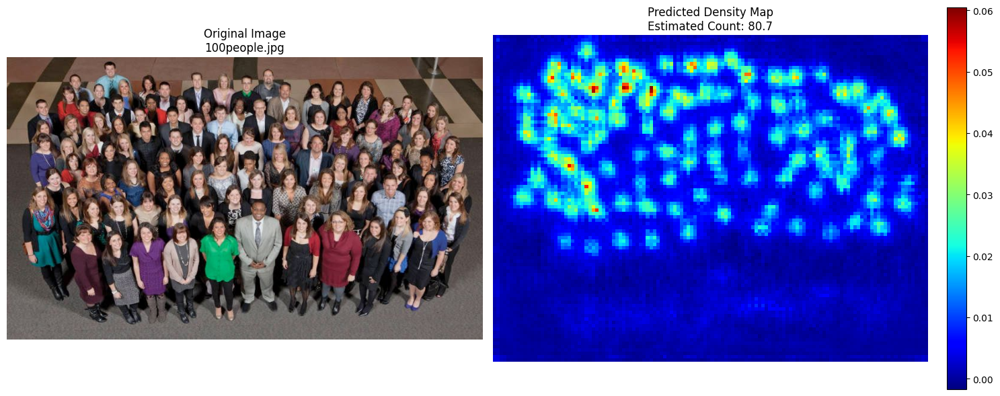

Predicted Head Count: 80.7


In [ ]:
image_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/100people.jpg"
model_weights_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/PartAmodel_best.pth (1).tar"
count, density_map = predict_and_visualize(image_path, model_weights_path, device)


In [8]:
import cv2
import numpy as np
import torch
import os
from CSRNet_NN import CSRNet  # Make sure this file is in your working directory

def preprocess_frame(frame, target_size=(1024, 768)):
    """Preprocess a video frame for CSRNet input."""
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB).astype(np.float32)
    img = cv2.resize(img, target_size, interpolation=cv2.INTER_LINEAR)
    img = img / 255.0
    img[..., 0] = (img[..., 0] - 0.485) / 0.229
    img[..., 1] = (img[..., 1] - 0.456) / 0.224
    img[..., 2] = (img[..., 2] - 0.406) / 0.225
    img_tensor = torch.tensor(np.transpose(img, (2, 0, 1)), dtype=torch.float32).unsqueeze(0)
    return img_tensor

def load_csrnet(model_weights_path, device='cpu'):
    """Load CSRNet model with weights (PyTorch 2.6+ compatible)."""
    model = CSRNet().to(device)
    checkpoint = torch.load(model_weights_path, map_location=device, weights_only=False)
    if 'state_dict' in checkpoint:
        model.load_state_dict(checkpoint['state_dict'])
    else:
        model.load_state_dict(checkpoint)
    model.eval()
    return model

def process_video(input_video_path, output_video_path, model_weights_path, device='cpu', target_size=(1024, 768)):
    """Process video, overlay predicted count, and save output."""
    # Load model
    model = load_csrnet(model_weights_path, device)
    
    # Open video
    cap = cv2.VideoCapture(input_video_path)
    if not cap.isOpened():
        print('Error: Cannot open video file')
        return

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    frame_count = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Preprocess and predict
        img_tensor = preprocess_frame(frame, target_size).to(device)
        with torch.no_grad():
            density_map = model(img_tensor).squeeze().cpu().numpy()
        count = np.sum(density_map)

        # Overlay count on frame
        cv2.putText(frame, f'Count: {count:.1f}', (30, 60), cv2.FONT_HERSHEY_SIMPLEX,
                    2, (0, 255, 0), 4, cv2.LINE_AA)

        # Write frame to output video
        out.write(frame)
        frame_count += 1
        if frame_count % 10 == 0:
            print(f"Processed {frame_count} frames...")

    cap.release()
    out.release()
    print(f'Processed video saved to {output_video_path}')

# Example usage
if __name__ == "__main__":
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    input_video_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/DJI_0074.MP4"
    output_video_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/DJI_0074_with_count_A.mp4"
    model_weights_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/PartAmodel_best.pth (1).tar"
    process_video(input_video_path, output_video_path, model_weights_path, device)


Processed 10 frames...
Processed 20 frames...
Processed 30 frames...
Processed 40 frames...
Processed 50 frames...
Processed 60 frames...
Processed 70 frames...
Processed 80 frames...
Processed 90 frames...
Processed 100 frames...
Processed 110 frames...
Processed 120 frames...
Processed 130 frames...
Processed 140 frames...
Processed 150 frames...
Processed 160 frames...
Processed 170 frames...
Processed 180 frames...
Processed 190 frames...
Processed 200 frames...
Processed 210 frames...
Processed 220 frames...
Processed 230 frames...
Processed 240 frames...
Processed 250 frames...
Processed 260 frames...
Processed 270 frames...
Processed 280 frames...
Processed 290 frames...
Processed 300 frames...
Processed 310 frames...
Processed 320 frames...
Processed 330 frames...
Processed 340 frames...
Processed 350 frames...
Processed 360 frames...
Processed 370 frames...
Processed 380 frames...
Processed 390 frames...
Processed 400 frames...
Processed 410 frames...
Processed 420 frames...
P

In [9]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
input_video_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/DJI_0074.MP4"
output_video_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/DJI_0074_with_count_B.mp4"
model_weights_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/partBmodel_best.pth.tar"
process_video(input_video_path, output_video_path, model_weights_path, device)

Processed 10 frames...
Processed 20 frames...
Processed 30 frames...
Processed 40 frames...
Processed 50 frames...
Processed 60 frames...
Processed 70 frames...
Processed 80 frames...
Processed 90 frames...
Processed 100 frames...
Processed 110 frames...
Processed 120 frames...
Processed 130 frames...
Processed 140 frames...
Processed 150 frames...
Processed 160 frames...
Processed 170 frames...
Processed 180 frames...
Processed 190 frames...
Processed 200 frames...
Processed 210 frames...
Processed 220 frames...
Processed 230 frames...
Processed 240 frames...
Processed 250 frames...
Processed 260 frames...
Processed 270 frames...
Processed 280 frames...
Processed 290 frames...
Processed 300 frames...
Processed 310 frames...
Processed 320 frames...
Processed 330 frames...
Processed 340 frames...
Processed 350 frames...
Processed 360 frames...
Processed 370 frames...
Processed 380 frames...
Processed 390 frames...
Processed 400 frames...
Processed 410 frames...
Processed 420 frames...
P

In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
input_video_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/Maha Kumbh Mela 2025 Drone Visuals _ World's Largest Gathering Of Humanity From The Skies.mp4"
output_video_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/Maha Kumbh Mela 2025 Drone Visuals _ World's Largest Gathering Of Humanity From The Skies_count.mp4"
model_weights_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/partBmodel_best.pth.tar"
process_video(input_video_path, output_video_path, model_weights_path, device)

Processed 10 frames...
Processed 20 frames...
Processed 30 frames...
Processed 40 frames...
Processed 50 frames...
Processed 60 frames...
Processed 70 frames...
Processed 80 frames...
Processed 90 frames...
Processed 100 frames...
Processed 110 frames...
Processed 120 frames...
Processed 130 frames...
Processed 140 frames...
Processed 150 frames...
Processed 160 frames...
Processed 170 frames...
Processed 180 frames...
Processed 190 frames...
Processed 200 frames...
Processed 210 frames...
Processed 220 frames...
Processed 230 frames...
Processed 240 frames...
Processed 250 frames...
Processed 260 frames...
Processed 270 frames...
Processed 280 frames...
Processed 290 frames...
Processed 300 frames...
Processed 310 frames...
Processed 320 frames...
Processed 330 frames...
Processed 340 frames...
Processed 350 frames...
Processed 360 frames...
Processed 370 frames...
Processed 380 frames...
Processed 390 frames...
Processed 400 frames...
Processed 410 frames...
Processed 420 frames...
P

KeyboardInterrupt: 

In [11]:
import cv2
import numpy as np
import torch
import os
from CSRNet_NN import CSRNet  # Make sure this file is in your working directory

def preprocess_frame(frame, target_size=(1024, 768)):
    """Preprocess a video frame for CSRNet input."""
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB).astype(np.float32)
    img = cv2.resize(img, target_size, interpolation=cv2.INTER_LINEAR)
    img = img / 255.0
    img[..., 0] = (img[..., 0] - 0.485) / 0.229
    img[..., 1] = (img[..., 1] - 0.456) / 0.224
    img[..., 2] = (img[..., 2] - 0.406) / 0.225
    img_tensor = torch.tensor(np.transpose(img, (2, 0, 1)), dtype=torch.float32).unsqueeze(0)
    return img_tensor

def load_csrnet(model_weights_path, device='cpu'):
    """Load CSRNet model with weights (PyTorch 2.6+ compatible)."""
    model = CSRNet().to(device)
    checkpoint = torch.load(model_weights_path, map_location=device, weights_only=False)
    if 'state_dict' in checkpoint:
        model.load_state_dict(checkpoint['state_dict'])
    else:
        model.load_state_dict(checkpoint)
    model.eval()
    return model

def process_video(input_video_path, output_video_path, model_weights_path, device='cpu', target_size=(1024, 768)):
    """Process video, overlay predicted count, and save output."""
    # Load model
    model = load_csrnet(model_weights_path, device)
    
    # Open video
    cap = cv2.VideoCapture(input_video_path)
    if not cap.isOpened():
        print('Error: Cannot open video file')
        return

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    frame_count = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Preprocess and predict
        img_tensor = preprocess_frame(frame, target_size).to(device)
        with torch.no_grad():
            density_map = model(img_tensor).squeeze().cpu().numpy()
        count = np.sum(density_map)

        # Overlay count on frame
        cv2.putText(frame, f'Count: {count:.1f}', (30, 60), cv2.FONT_HERSHEY_SIMPLEX,
                    2, (0, 255, 0), 4, cv2.LINE_AA)

        # Write frame to output video
        out.write(frame)
        frame_count += 1
        if frame_count % 40 == 0:
            print(f"Processed {frame_count} frames...")

    cap.release()
    out.release()
    print(f'Processed video saved to {output_video_path}')

# Example usage
if __name__ == "__main__":
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    input_video_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/Untitled design.mp4"
    output_video_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/Untitled design_Counting.mp4"
    model_weights_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/PartAmodel_best.pth (1).tar"
    process_video(input_video_path, output_video_path, model_weights_path, device)


Processed 40 frames...
Processed 80 frames...
Processed 120 frames...
Processed 160 frames...
Processed 200 frames...
Processed 240 frames...
Processed 280 frames...
Processed 320 frames...
Processed 360 frames...
Processed 400 frames...
Processed 440 frames...
Processed 480 frames...
Processed 520 frames...
Processed 560 frames...
Processed 600 frames...
Processed 640 frames...
Processed 680 frames...
Processed 720 frames...
Processed 760 frames...
Processed 800 frames...
Processed 840 frames...
Processed 880 frames...
Processed 920 frames...
Processed 960 frames...
Processed 1000 frames...
Processed 1040 frames...
Processed video saved to /Users/soumyadip_iitk/Desktop/Dense Crowd Model/Untitled design_Counting.mp4


In [12]:
import cv2
import numpy as np
import torch
import os
from CSRNet_NN import CSRNet 

def preprocess_frame(frame, target_size=(1024, 768)):
    """Preprocess a video frame for CSRNet input."""
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB).astype(np.float32)
    img = cv2.resize(img, target_size, interpolation=cv2.INTER_LINEAR)
    img = img / 255.0
    img[..., 0] = (img[..., 0] - 0.485) / 0.229
    img[..., 1] = (img[..., 1] - 0.456) / 0.224
    img[..., 2] = (img[..., 2] - 0.406) / 0.225
    img_tensor = torch.tensor(np.transpose(img, (2, 0, 1)), dtype=torch.float32).unsqueeze(0)
    return img_tensor

def load_csrnet(model_weights_path, device='cpu'):
    """Load CSRNet model with weights (PyTorch 2.6+ compatible)."""
    model = CSRNet().to(device)
    checkpoint = torch.load(model_weights_path, map_location=device, weights_only=False)
    if 'state_dict' in checkpoint:
        model.load_state_dict(checkpoint['state_dict'])
    else:
        model.load_state_dict(checkpoint)
    model.eval()
    return model

def densitymap_to_heatmap(density_map, out_shape):
    """Convert density map to a heatmap image for visualization."""
    density_map = density_map.astype(np.float32)
    density_map = density_map / (density_map.max() + 1e-8)  # Normalize to [0,1]
    density_map = (density_map * 255).clip(0, 255).astype(np.uint8)
    heatmap = cv2.applyColorMap(density_map, cv2.COLORMAP_JET)
    heatmap = cv2.resize(heatmap, out_shape, interpolation=cv2.INTER_LINEAR)
    return heatmap

def process_video_with_heatmap(input_video_path, output_video_path, model_weights_path, device='cpu', target_size=(1024, 768)):
    """Process video, overlay predicted count, draw heatmap, and save output."""
    # Load model
    model = load_csrnet(model_weights_path, device)
    
    # Open video
    cap = cv2.VideoCapture(input_video_path)
    if not cap.isOpened():
        print('Error: Cannot open video file')
        return

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')

    # Output frame will be original + heatmap side by side
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width * 2, height))

    frame_count = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Preprocess and predict
        img_tensor = preprocess_frame(frame, target_size).to(device)
        with torch.no_grad():
            density_map = model(img_tensor).squeeze().cpu().numpy()
        count = np.sum(density_map)

        # Overlay count on frame
        cv2.putText(frame, f'Count: {count:.1f}', (30, 60), cv2.FONT_HERSHEY_SIMPLEX,
                    2, (0, 255, 0), 4, cv2.LINE_AA)

        # Convert density map to heatmap
        heatmap = densitymap_to_heatmap(density_map, (width, height))

        # Concatenate original frame and heatmap
        combined = np.concatenate((frame, heatmap), axis=1)

        # Write to output video
        out.write(combined)
        frame_count += 1
        if frame_count % 200 == 0:
            print(f"Processed {frame_count} frames...")

    cap.release()
    out.release()
    print(f'Processed video with heatmap saved to {output_video_path}')

# Example usage
if __name__ == "__main__":
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    input_video_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/Untitled design.mp4"
    output_video_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/Untitled design_count_and_heatmap.mp4"
    model_weights_path = "/Users/soumyadip_iitk/Desktop/Dense Crowd Model/PartAmodel_best.pth (1).tar"
    process_video_with_heatmap(input_video_path, output_video_path, model_weights_path, device)


Processed 200 frames...
Processed 400 frames...
Processed 600 frames...
Processed 800 frames...
Processed 1000 frames...
Processed video with heatmap saved to /Users/soumyadip_iitk/Desktop/Dense Crowd Model/Untitled design_count_and_heatmap.mp4
